# Mouse Bone Marrow from Dahlin et al. 

Here we analyse sample 4 (SIGAD1) of Bone Marrow from [Dahlin et al.](http://www.bloodjournal.org/content/131/21/e1?sso-checked=true) (10X-Cellranger 1.3). 
Link to the dataset: [GSE107727](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE107727)

In [1]:
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb

import rpy2.rinterface_lib.callbacks
import logging

from rpy2.robjects import pandas2ri
import anndata2ri

In [2]:
# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 3
#sc.set_figure_params(dpi=200, dpi_save=300)
sc.logging.print_versions()

scanpy==1.4.4+40.gbd5f862 anndata==0.6.22.post1 umap==0.3.9 numpy==1.15.4 scipy==1.3.0 pandas==0.24.2 scikit-learn==0.21.2 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1


In [3]:
# install some R packages through rpy2 (the rest are installed via conda)
packnames = ('RColorBrewer', 'gam', 'ggplot2', 'plyr')
from rpy2.robjects.vectors import StrVector
#utils.install_packages(StrVector(packnames))
results_file = './write/BM_Dahlin_4.h5ad'  # the file that will store the analysis results

In [5]:
%%R
# Load all the R libraries we will be using in the notebook
library(scran)

In [4]:
## Load previously processed dataset
#adata = sc.read_h5ad(results_file)
#adata.obs.index.names = ['barcode']

In [6]:
# Set up data loading
file = '../../Munich/datasets/mouse/Dahlin_BoneMarrow/GSE107727_RAW/GSM2877129_SIGAD1_counts.txt.gz'
adata = sc.read(filename=file, cache=True)
adata = adata.transpose()

... reading from cache file cache/..-..-Munich-datasets-mouse-Dahlin_BoneMarrow-GSE107727_RAW-GSM2877129_SIGAD1_counts.h5ad


In [7]:
adata

AnnData object with n_obs × n_vars = 7486 × 27998 

In [8]:
adata.var.head()

""
index
ENSMUSG00000051951
ENSMUSG00000089699
ENSMUSG00000102343
ENSMUSG00000025900
ENSMUSG00000109048


In [9]:
adata.var.index.names = ['gene_ensembl']
adata.var.head()

""
gene_ensembl
ENSMUSG00000051951
ENSMUSG00000089699
ENSMUSG00000102343
ENSMUSG00000025900
ENSMUSG00000109048


In [10]:
mapEnsembl2gene_symbol = pd.read_csv('../../Munich/datasets/mouse/Dahlin_BoneMarrow/ensembl2gene_symbol.tsv', header=None, sep='\t')
mapEnsembl2gene_symbol.head()

,0,1
0,ENSMUSG00000051951,Xkr4
1,ENSMUSG00000089699,Gm1992
2,ENSMUSG00000102343,Gm37381
3,ENSMUSG00000025900,Rp1
4,ENSMUSG00000109048,Rp1


In [11]:
mapEnsembl2gene_symbol.rename(columns={0:'gene_ensembl', 1:'gene_symbol'}, inplace=True)
mapEnsembl2gene_symbol.head()

,gene_ensembl,gene_symbol
0,ENSMUSG00000051951,Xkr4
1,ENSMUSG00000089699,Gm1992
2,ENSMUSG00000102343,Gm37381
3,ENSMUSG00000025900,Rp1
4,ENSMUSG00000109048,Rp1


In [12]:
adata_genes = adata.var.reset_index()
adata_genes.head()

,gene_ensembl
0,ENSMUSG00000051951
1,ENSMUSG00000089699
2,ENSMUSG00000102343
3,ENSMUSG00000025900
4,ENSMUSG00000109048


In [13]:
# merge the two dataframes
adata_genes_merge = adata_genes.merge(mapEnsembl2gene_symbol, how='left', on='gene_ensembl')
adata_genes_merge.head()

,gene_ensembl,gene_symbol
0,ENSMUSG00000051951,Xkr4
1,ENSMUSG00000089699,Gm1992
2,ENSMUSG00000102343,Gm37381
3,ENSMUSG00000025900,Rp1
4,ENSMUSG00000109048,Rp1


In [14]:
# reassign merged dataframe as adata.var
adata_genes_merge.set_index('gene_symbol', inplace = True)
adata.var = adata_genes_merge

In [15]:
all(adata.var.index.notnull())

True

In [16]:
adata.var_names_make_unique()

In [17]:
adata.obs.head()

""
index
AAACCTGAGATATGGT-1
AAACCTGAGCCGTCGT-1
AAACCTGAGGGAACGG-1
AAACCTGAGGGTCTCC-1
AAACCTGCAACACCCG-1


In [18]:
adata.obs.index.names = ['barcode']
adata.obs.head()

""
barcode
AAACCTGAGATATGGT-1
AAACCTGAGCCGTCGT-1
AAACCTGAGGGAACGG-1
AAACCTGAGGGTCTCC-1
AAACCTGCAACACCCG-1


In [19]:
# Checking the total size of the data set
adata.shape

(7486, 27998)

# 1. Pre-processing and visualization

## 1.1 Quality control

In [20]:
# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

In [21]:
mt_gene_mask = [gene.startswith('mt-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']


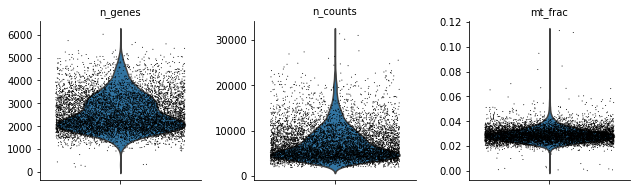

In [22]:
# Quality control - plot QC metrics
sc.pl.violin(adata, ['n_genes', 'n_counts', 'mt_frac'],
             jitter=0.4, multi_panel=True)

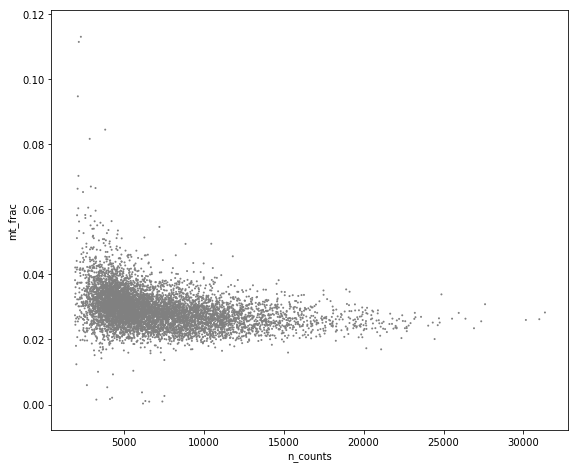

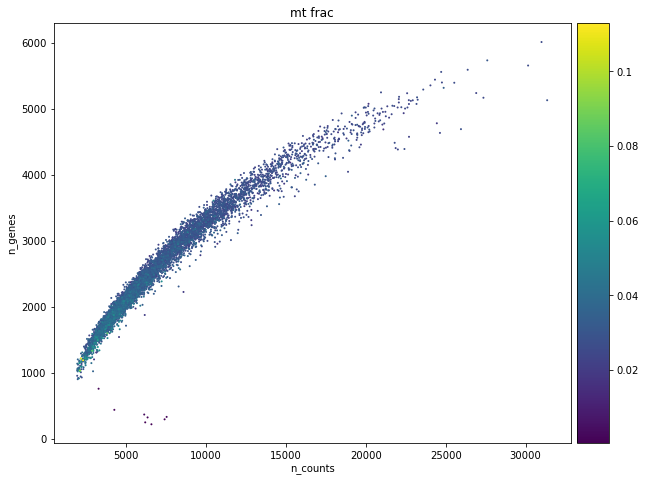

In [23]:
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='mt_frac')

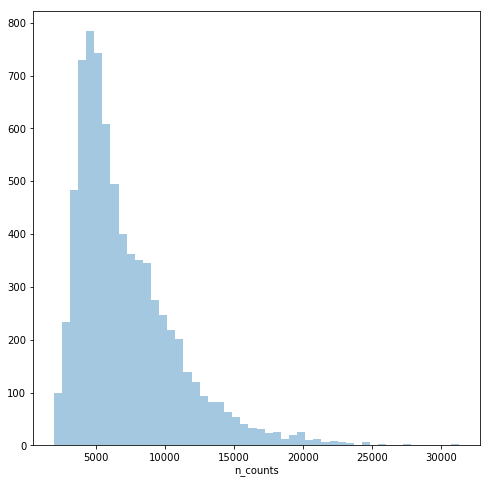

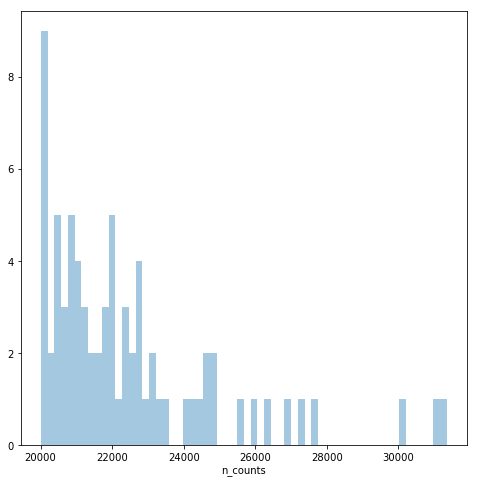

In [24]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>20000], kde=False, bins=60)
plt.show()

In [25]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 30000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.2]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))


Total number of cells: 7486
filtered out 3 cells that havemore than 30000 counts
Number of cells after max count filter: 7483
Number of cells after MT filter: 7483


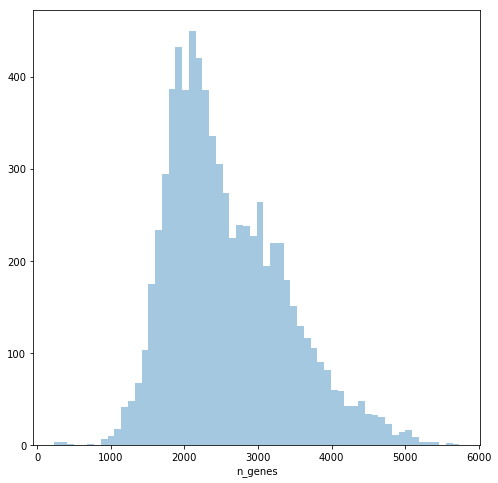

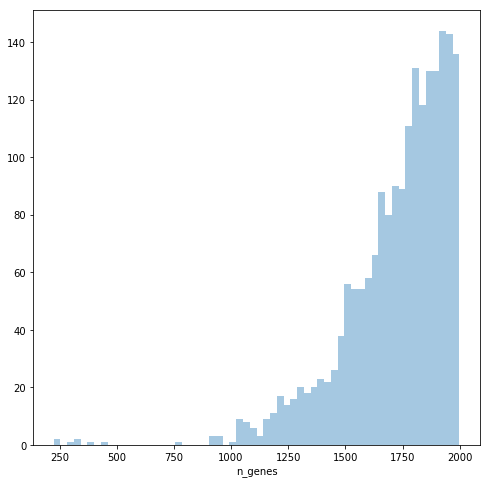

In [26]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes']< 2000], kde=False, bins=60)
plt.show()



From the histograms of the number of genes per cell, we can notice that there still is a small population showing n_genes < 1000 which should be filtered out.

In [27]:
# Thresholding on number of genes
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 1000)
print('Number of cells after gene filter: {:d}'.format(adata.n_obs))

Total number of cells: 7483
filtered out 14 cells that haveless than 1000 genes expressed


Trying to set attribute `.obs` of view, making a copy.


Number of cells after gene filter: 7469


In [28]:
#Filter genes:
print('Total number of genes: {:d}'.format(adata.n_vars))

# Min 20 cells - filters out 0 count genes
sc.pp.filter_genes(adata, min_cells=20)
print('Number of genes after cell filter: {:d}'.format(adata.n_vars))

Total number of genes: 27998
filtered out 15179 genes that are detectedin less than 20 cells
Number of genes after cell filter: 12819


## 1.2 Normalization

In [29]:
#Perform a clustering for scran normalization in clusters
adata_pp = adata.copy()
sc.pp.normalize_per_cell(adata_pp, counts_per_cell_after=1e6)
sc.pp.log1p(adata_pp)
sc.pp.pca(adata_pp, n_comps=15, svd_solver='arpack')
sc.pp.neighbors(adata_pp)
sc.tl.louvain(adata_pp, key_added='groups', resolution=1)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
computing PCA with n_comps = 15
    finished (0:00:03)
computing neighbors
    using 'X_pca' with n_pcs = 15
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:04)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 14 clusters and added
    'groups', the cluster labels (adata.obs, categorical) (0:00:00)


In [30]:
# Check if the minimum number of cells per cluster is < 21:in that case, sizes will be also passed as input to the normalization
adata_pp.obs['groups'].value_counts()

0     1149
1      806
2      793
3      684
4      606
5      587
6      578
7      509
8      493
9      466
10     420
11     196
12     146
13      36
Name: groups, dtype: int64

In [31]:
#Preprocess variables for scran normalization
input_groups = adata_pp.obs['groups']
data_mat = adata.X.T

In [32]:
%%R -i data_mat -i input_groups -o size_factors

size_factors = computeSumFactors(data_mat, clusters=input_groups, min.mean=0.1)

In [33]:
#Delete adata_pp
del adata_pp

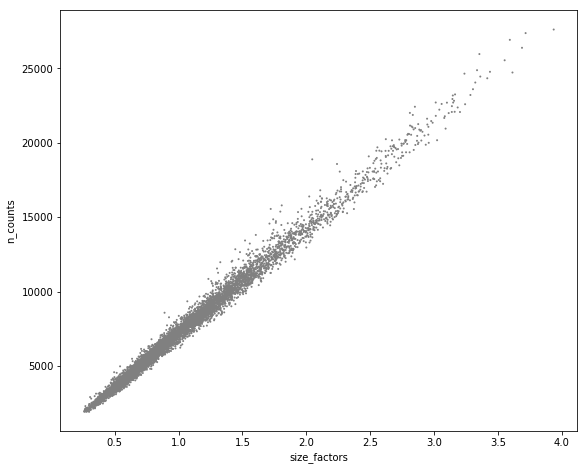

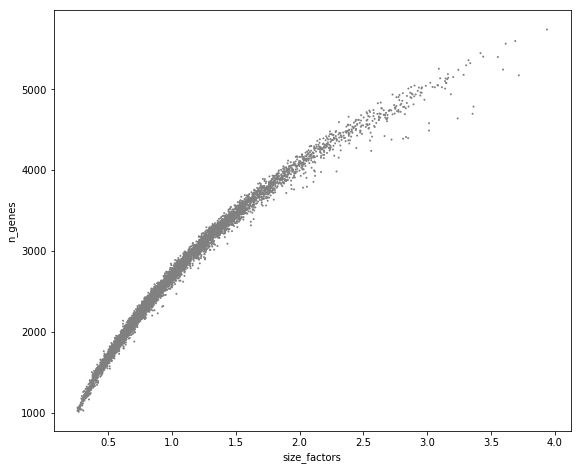

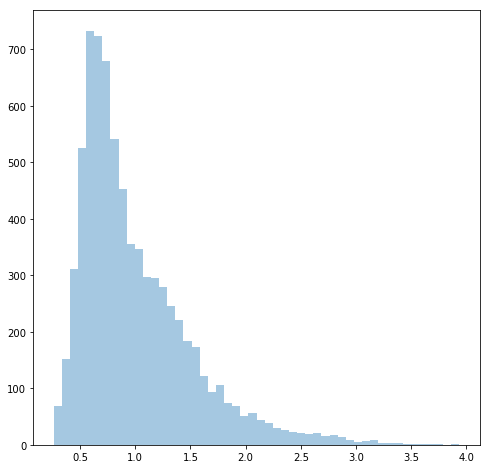

In [34]:
# Visualize the estimated size factors
adata.obs['size_factors'] = size_factors

sc.pl.scatter(adata, 'size_factors', 'n_counts')
sc.pl.scatter(adata, 'size_factors', 'n_genes')

sb.distplot(size_factors, bins=50, kde=False)
plt.show()

In [35]:
#Keep the count data in a counts layer
adata.layers["counts"] = adata.X.copy()

In [36]:
#Normalize adata 
adata.X /= adata.obs['size_factors'].values[:,None]
sc.pp.log1p(adata)

In [37]:
# Store the full data set in 'raw' as log-normalised data for statistical testing
adata.raw = adata

## 1.3 Highly variable genes

In [38]:
sc.pp.highly_variable_genes(adata, flavor='cell_ranger', n_top_genes=4000)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata.var['highly_variable'])))

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 4000


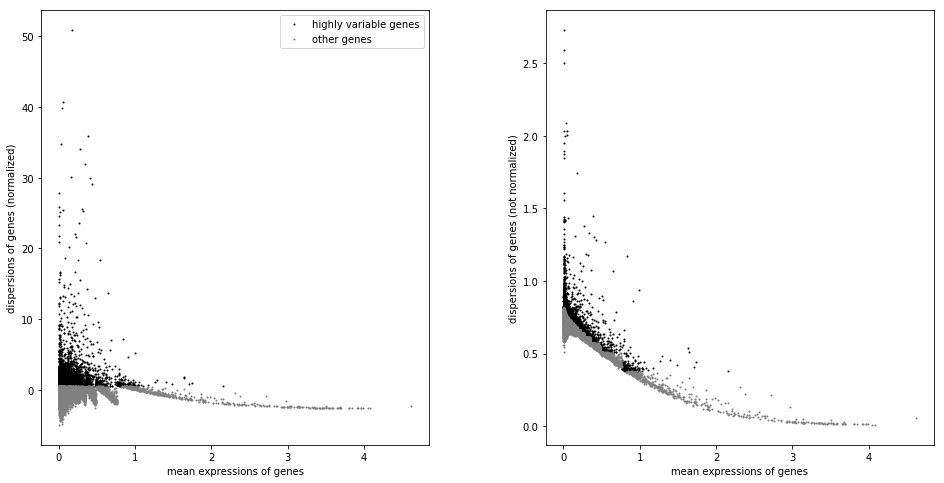

In [39]:
sc.pl.highly_variable_genes(adata)

# 2. Visualization

In [40]:
# Calculate the visualizations
sc.pp.pca(adata, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata)

sc.tl.umap(adata)
sc.tl.diffmap(adata)
sc.tl.draw_graph(adata)

computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:03)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:22)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9865338  0.9707434  0.9623724  0.9617567  0.9552607
     0.9523685  0.94411683 0.93460137 0.92410576 0.9229757  0.9214676
     0.91308844 0.9032773  0.89577174]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:01:16)


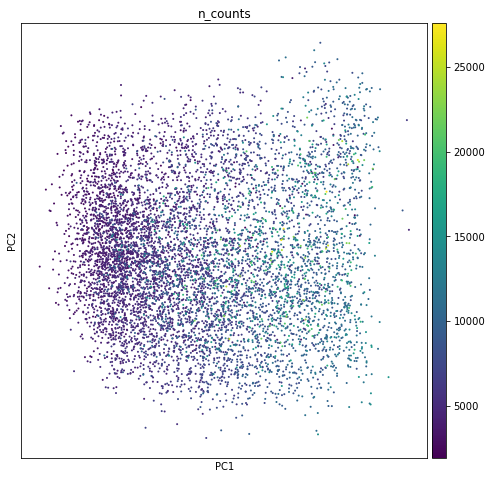

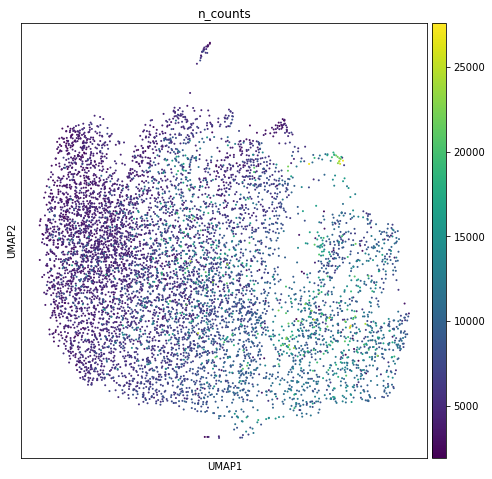

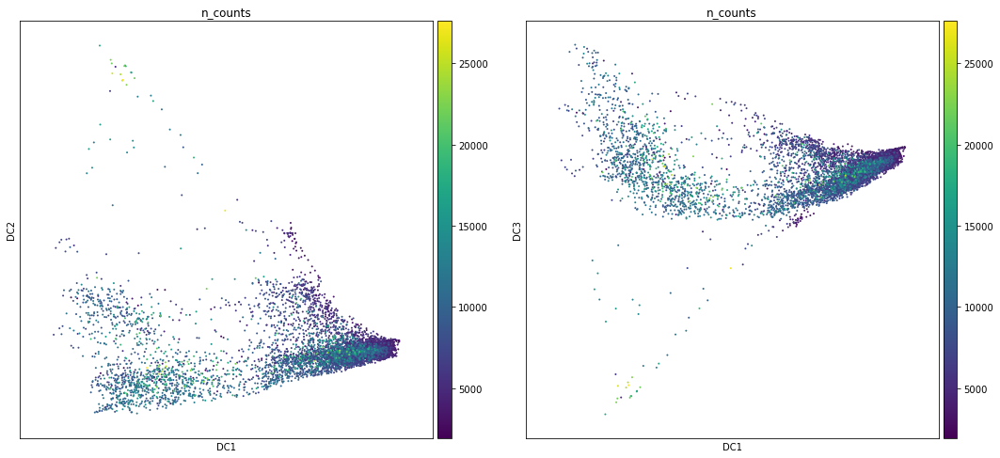

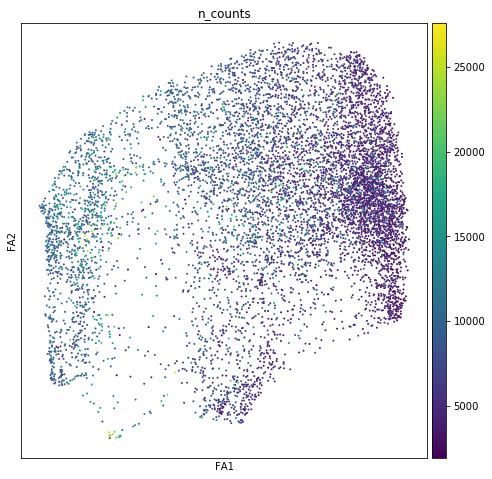

In [41]:
sc.pl.pca_scatter(adata, color='n_counts')
sc.pl.umap(adata, color='n_counts')
sc.pl.diffmap(adata, color='n_counts', components=['1,2','1,3'])
sc.pl.draw_graph(adata, color='n_counts')

In [42]:
adata.write(results_file)

# 3. Clustering

In [43]:
# Perform clustering - using highly variable genes
sc.tl.louvain(adata, key_added='louvain_r1')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 12 clusters and added
    'louvain_r1', the cluster labels (adata.obs, categorical) (0:00:00)


In [44]:
adata.obs['louvain_r1'].value_counts()

0     1615
1     1151
2      946
3      668
4      648
5      605
6      499
7      484
8      464
9      256
10     112
11      21
Name: louvain_r1, dtype: int64

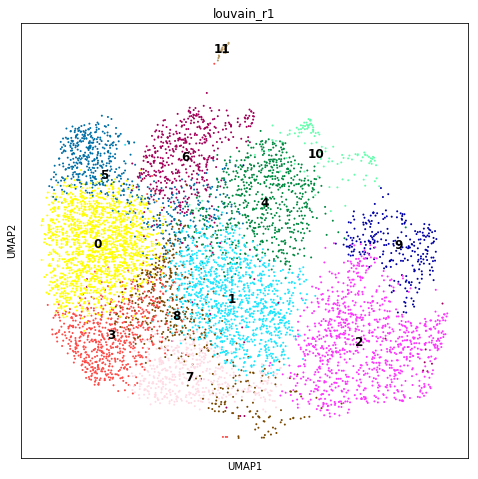

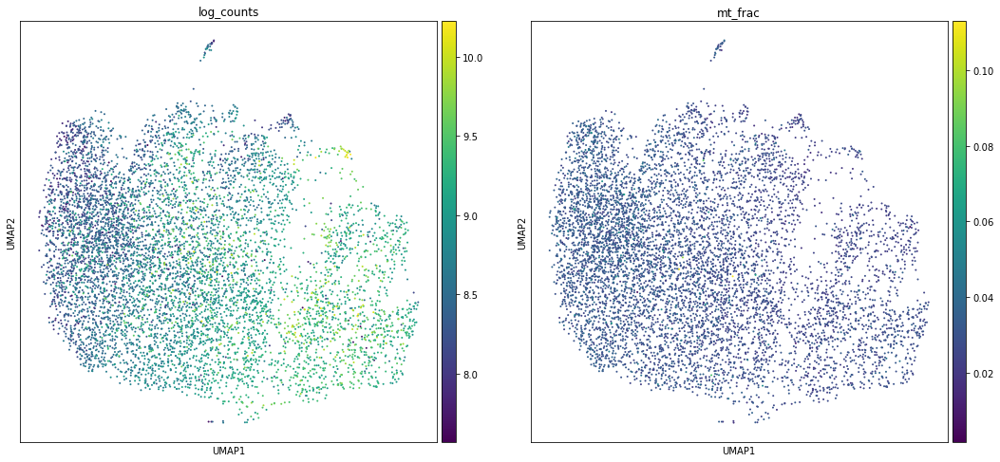

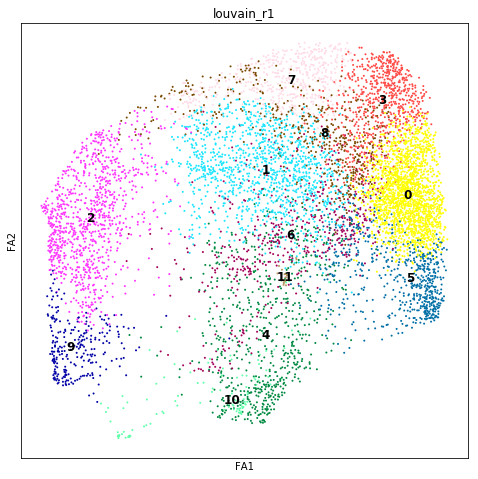

In [45]:
#Visualize the clustering and how this is reflected by different technical covariates
sc.pl.umap(adata, color=['louvain_r1'], palette=sc.pl.palettes.default_64, legend_loc='on data', legend_fontsize=12)
sc.pl.umap(adata, color=['log_counts', 'mt_frac'])
sc.pl.draw_graph(adata, color='louvain_r1', palette=sc.pl.palettes.default_64, legend_loc='on data', legend_fontsize=12)


# 4. Markers and cluster annotation (r 1)

In [46]:
#Calculate marker genes r1
sc.tl.rank_genes_groups(adata, groupby='louvain_r1', key_added='rank_genes_r1')

ranking genes
    finished: added to `.uns['rank_genes_r1']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:06)


## 4.1 List of markers of cell types from PanglaoDB
Here we use a list of markers for 34 different cell types from PanglaoDB, considering all cell types in "immune system" + "blood" + "bone". We manually checked that all cell types were possible for healthy tissue, so we excluded:
* __Myeloid derived suppressor cells__, description: MDSC are not present at steady state in healthy individuals and appear in cancer and pathological conditions associated with chronic inflammation or stress. 
* __Red pulp macrophages__, description: Present in the red pulp of the spleen. They are necessary for maintaining blood homeostasis by performing phagocytosis upon injured and senescent erythrocytes and blood-borne particulates.

In [47]:
markers_df = pd.read_csv('../../Munich/Immune_markers_PanglaoDB.txt', delimiter='\t')
markers_df.shape

(2089, 14)

In [48]:
markers_df = markers_df[markers_df['cell.type'] != 'Myeloid-derived suppressor cells']
markers_df.shape

(2072, 14)

In [49]:
markers_df = markers_df[markers_df['cell.type'] != 'Red pulp macrophages']
markers_df.shape

(2060, 14)

In [50]:
# Restrict the markers to only mouse 
markers_df_mou = markers_df[(markers_df['species'] == 'Mm') | (markers_df['species'] == 'Mm Hs')]
markers_df_mou.shape

(1895, 14)

In [51]:
cell_types = list(markers_df_mou['cell.type'].unique())

In [52]:
markers_dict = {}
for ctype in cell_types:
    df = markers_df_mou[markers_df_mou['cell.type'] == ctype]
    genes = df['official.gene.symbol'].to_list()
    markers_dict[ctype] = [item.lower().capitalize() for item in genes]

In [53]:
cell_annotation = sc.tl.marker_gene_overlap(adata, markers_dict, key='rank_genes_r1')

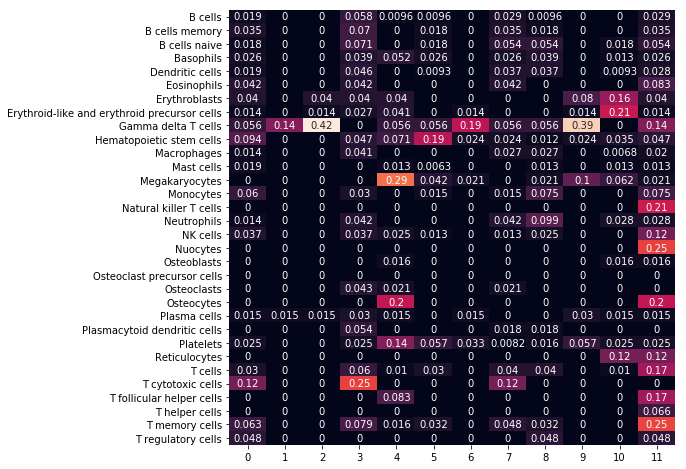

In [54]:
cell_annotation_norm = sc.tl.marker_gene_overlap(adata, markers_dict, key='rank_genes_r1', normalize='reference')
sb.heatmap(cell_annotation_norm, cbar=False, annot=True)

Seems to be very hard to assign a cell type using this set of markers. So, we plot our known markers.

# 5. Plot makers of subtypes

Here we plot the markers that identified cell types in the human BM/ PBMCs.

In [55]:
#Define a nice colour map for gene expression
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

## T cells

We want to annotate CD8+ versus CD4+ cells.
For the labels to be consistent with the MCA-derived, we check the expression of those markers as well (when possible).

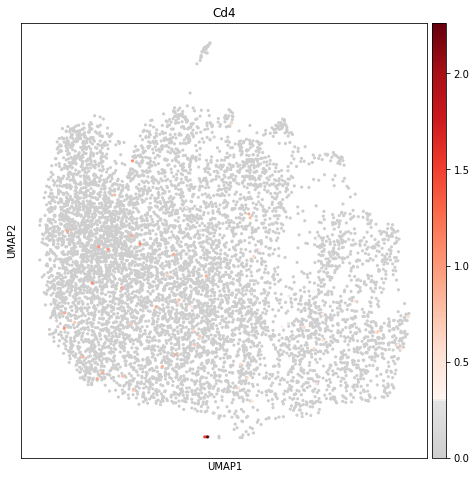

In [56]:
#Canonical markers  #Cd8a and Cd8b not present
sc.pl.umap(adata, color=['Cd4'], use_raw=False, color_map=mymap, size = 40)

# Markers from MCA not there
#sc.pl.umap(adata, color=['Trbc2'], use_raw=False, color_map=mymap)

## NK cells

We consider NK cells as CD8- CD4-. NKT cells are instead CD8+/CD4+ and NKG7/GZMA +.

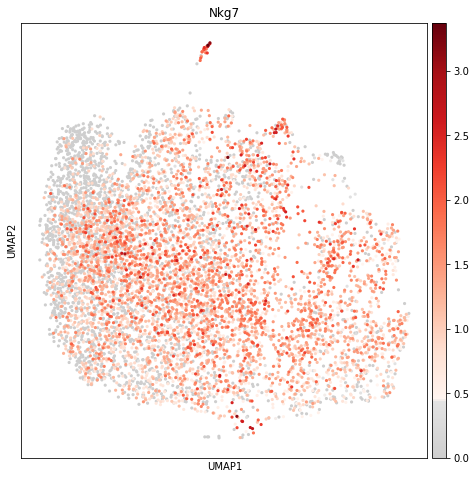

In [61]:
# Gnly and Cd160 not present
sc.pl.umap(adata, color=['Nkg7'], use_raw=False, color_map=mymap, size = 40)

# marker from MCA not present
#sc.pl.umap(adata, color=['Gzma'], use_raw=False, color_map=mymap)

## Monocytes: CD14+ and CD16+

In [65]:
# Fcgr3a not present
#sc.pl.umap(adata, color=['Cd14'], use_raw=False, color_map=mymap, size = 40)

## Monocytes progenitors

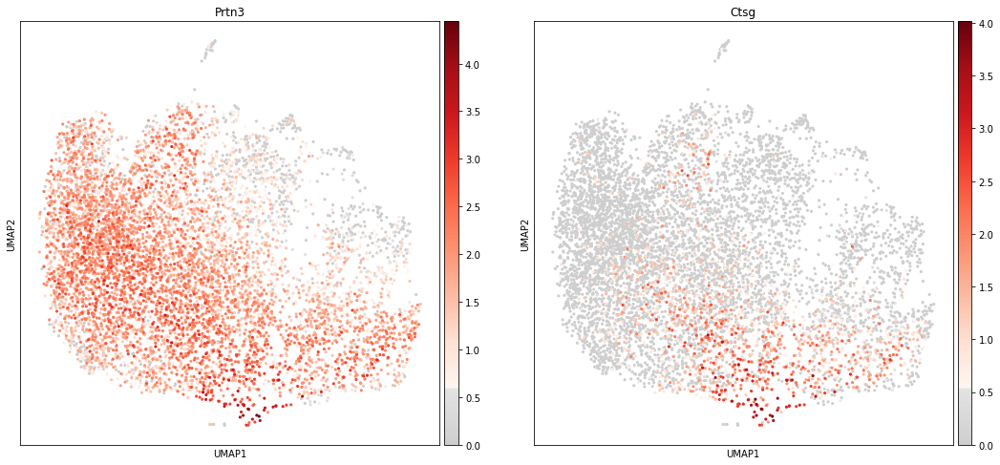

In [66]:
# Markers from MCA
sc.pl.umap(adata, color=['Prtn3','Ctsg'], use_raw=False, color_map=mymap, size = 40)

## Monocyte-derived Dendritic cells

Here we use markers from [Sinha et al.](https://www.ncbi.nlm.nih.gov/pubmed/29361178)

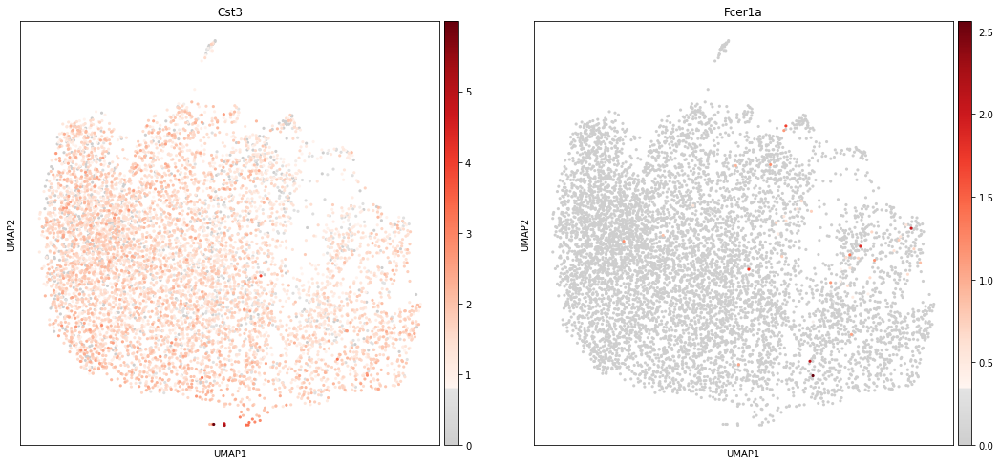

In [67]:
# Cd1c not present
sc.pl.umap(adata, color=['Cst3', 'Fcer1a'], use_raw=False, color_map=mymap, size = 40)

## Plasmacytoid dendritic cells

Here we use markers from [Sinha et al.](https://www.ncbi.nlm.nih.gov/pubmed/29361178)

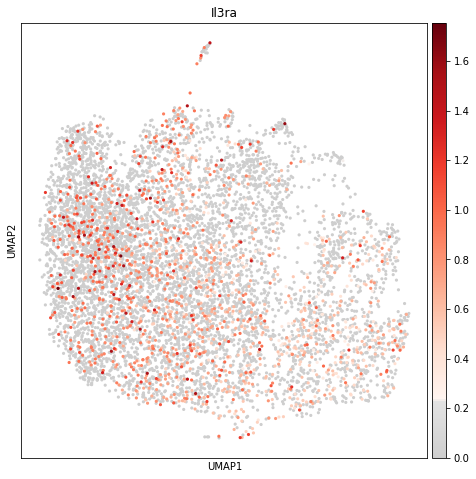

In [69]:
# Gzmb not present
sc.pl.umap(adata, color=[ 'Il3ra'], use_raw=False, color_map=mymap, size= 40)

## B cells

Oetjen et al. annotates B cells as CD20+ (MS4A1) or CD10+ (MME).


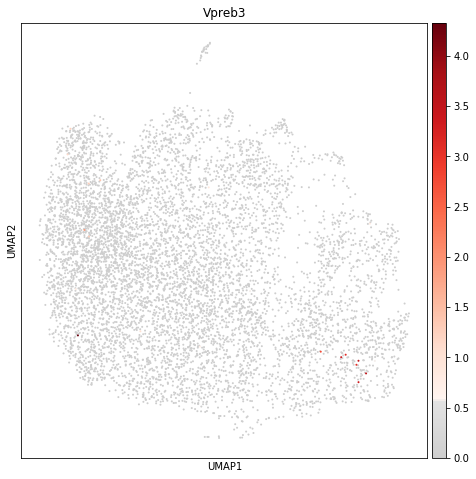

In [72]:
# Oetjen # Mme and Ms4a1 not present
#sc.pl.umap(adata, color=['Mme'], use_raw=False, color_map=mymap)

# markers from MCA
sc.pl.umap(adata, color=['Vpreb3'], use_raw=False, color_map=mymap)

## Hematopoietic stem progenitors cells (HSPCs)

Using markers from [CellMarker](http://biocc.hrbmu.edu.cn/CellMarker/search.jsp?quickSearchInfo=bone%20marrow)

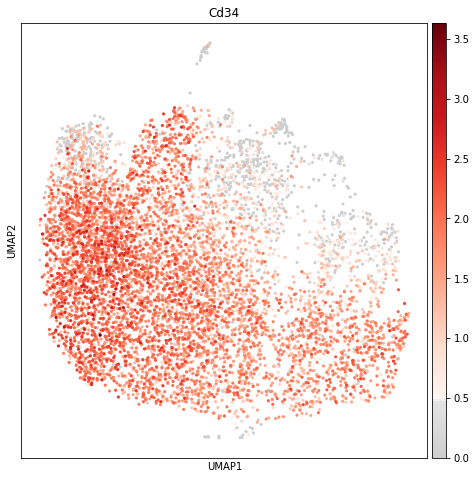

In [75]:
# Prom1 not there
sc.pl.umap(adata, color=['Cd34'], use_raw=False, color_map=mymap, size=40)

## Erythrocytes

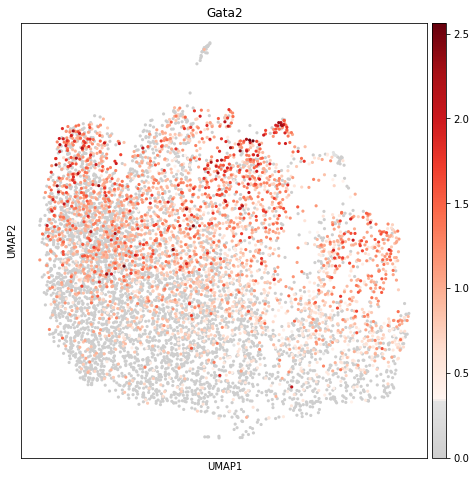

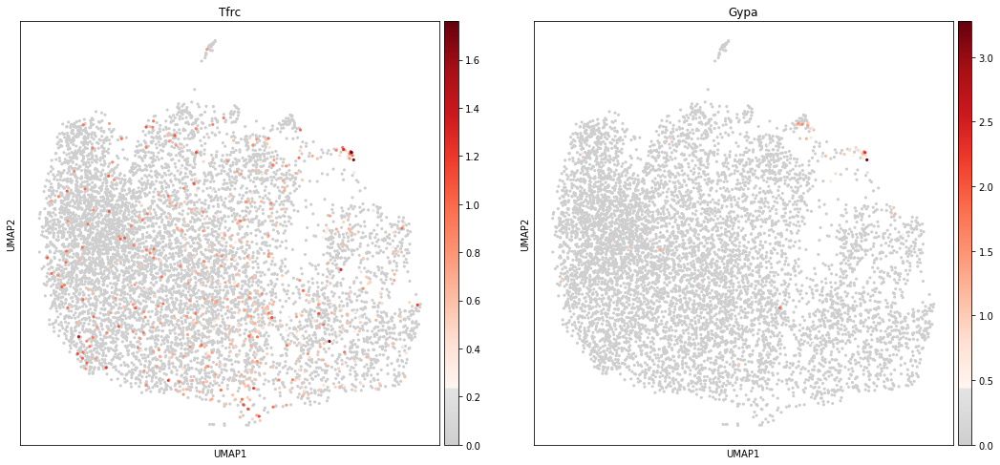

In [76]:
# Erythrocytes progenitors
sc.pl.umap(adata, color=['Gata2'], use_raw=False, color_map=mymap, size= 40)

# markers from CellMarker (differentiated) 
sc.pl.umap(adata, color=['Tfrc', 'Gypa'], use_raw=False, color_map=mymap, size= 40)

# markers from Oetjen and MCA (differentiated) not there
#sc.pl.umap(adata, color=['Hbd','Hba1'], use_raw=False, color_map=mymap)

## Plasma cells

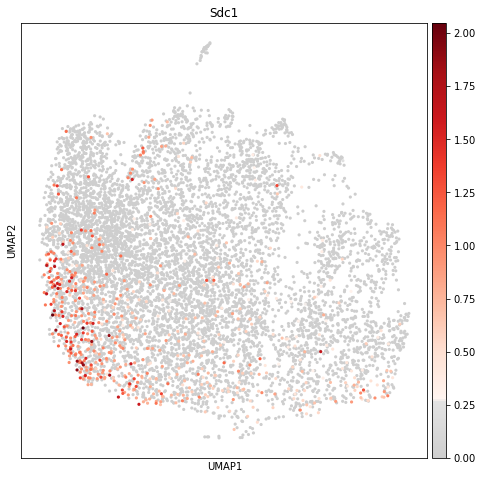

In [77]:
# From CellMarker #Igkc not there
sc.pl.umap(adata, color=['Sdc1'], use_raw=False, color_map=mymap, size=40)

# 6. Using markers from Dahlin et al. 

## HSPCs

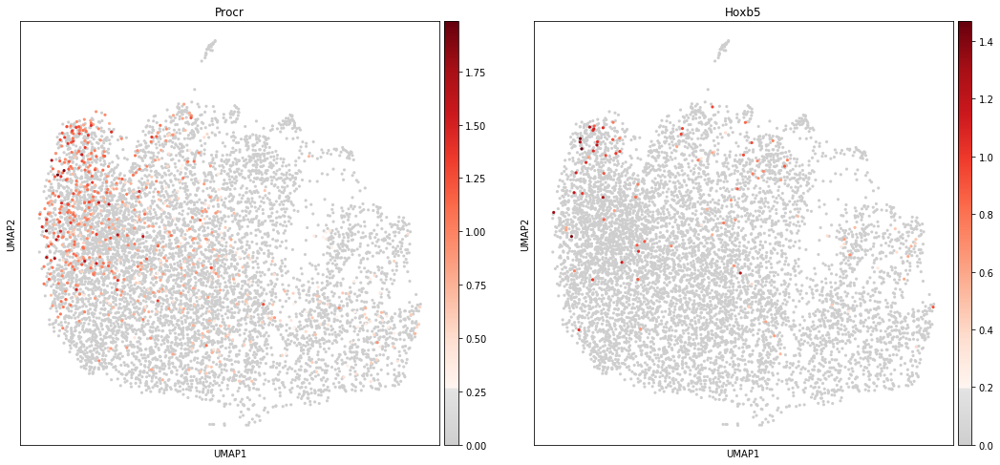

In [78]:
sc.pl.umap(adata, color=['Procr', 'Hoxb5'], use_raw=False, color_map=mymap, size=40)

## Lymphoid progenitors

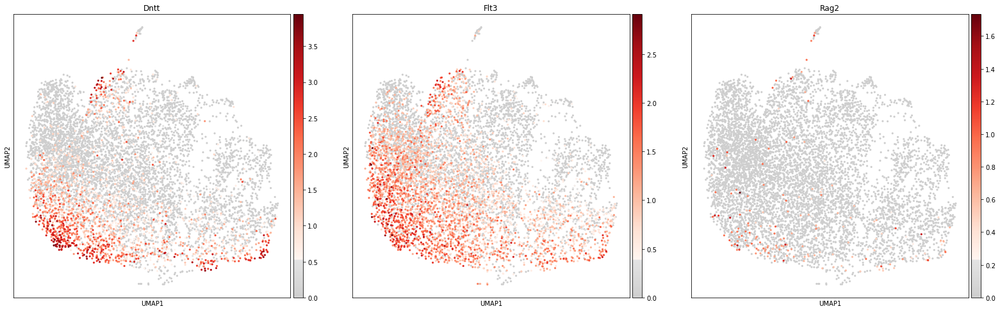

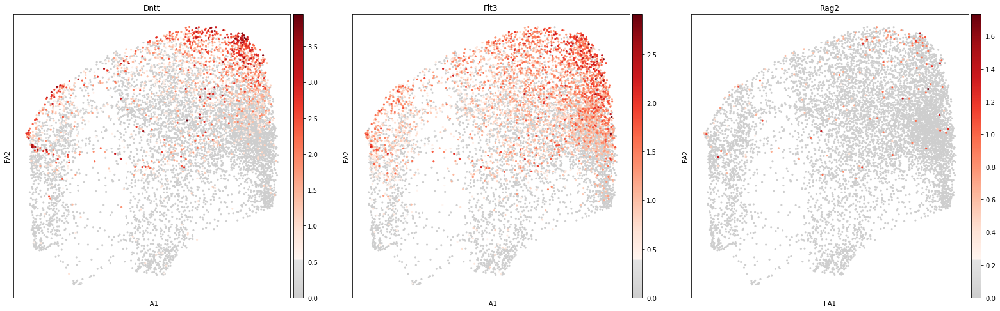

In [79]:
sc.pl.umap(adata, color=['Dntt', 'Flt3', 'Rag2'], use_raw=False, color_map=mymap, size=40)
sc.pl.draw_graph(adata, color=['Dntt', 'Flt3', 'Rag2'], use_raw=False, color_map=mymap, size=40)

## Megakaryocyte progenitors

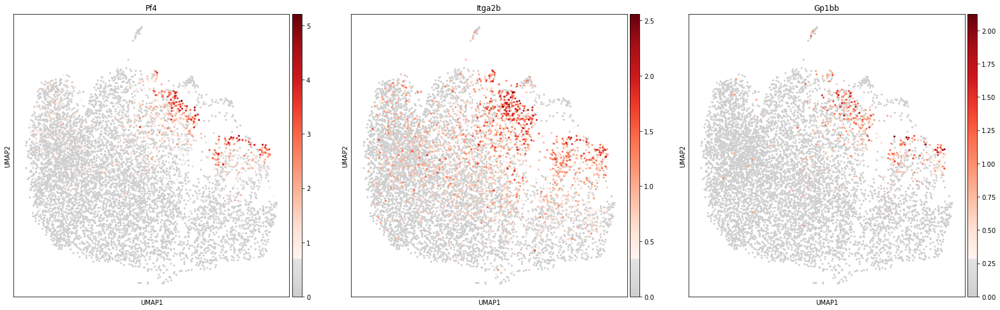

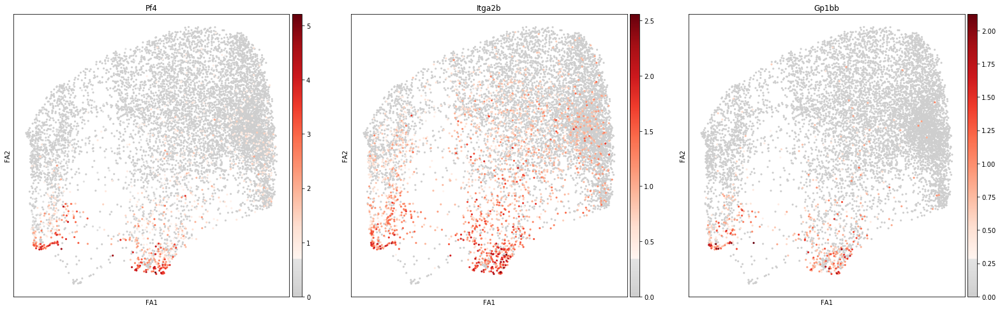

In [80]:
sc.pl.umap(adata, color=['Pf4', 'Itga2b', 'Gp1bb'], use_raw=False, color_map=mymap, size=40)
sc.pl.draw_graph(adata, color=['Pf4', 'Itga2b', 'Gp1bb'], use_raw=False, color_map=mymap, size=40)

## Erythroid cells

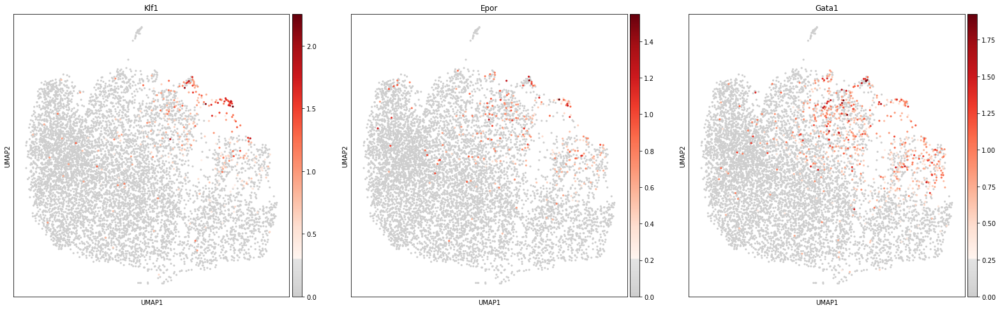

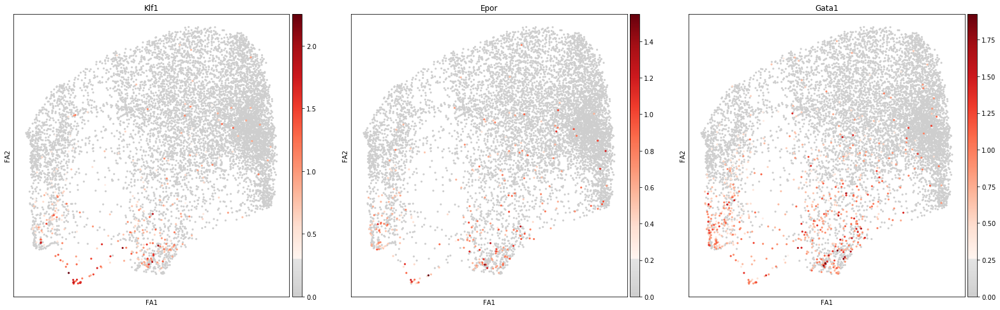

In [81]:
sc.pl.umap(adata, color=['Klf1', 'Epor', 'Gata1'], use_raw=False, color_map=mymap, size=40)
sc.pl.draw_graph(adata, color=['Klf1', 'Epor', 'Gata1'], use_raw=False, color_map=mymap, size=40)

## Neutrophils

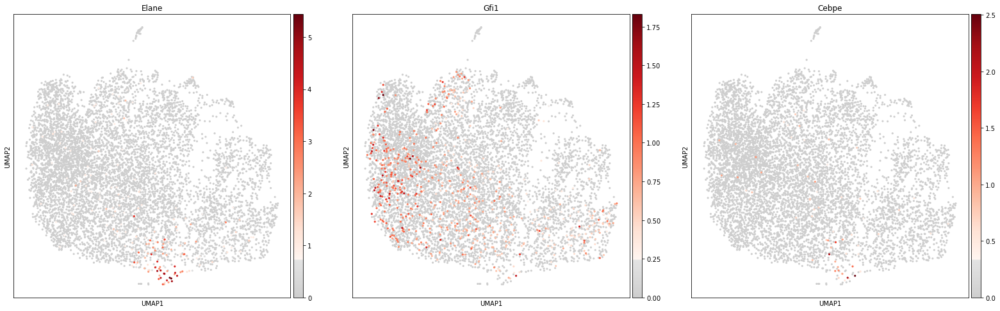

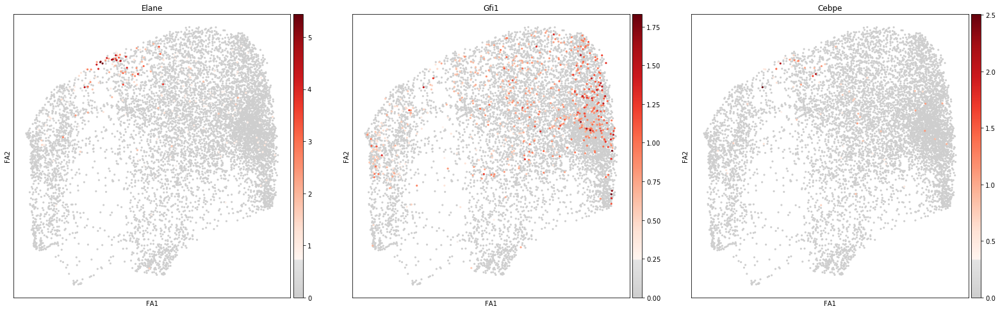

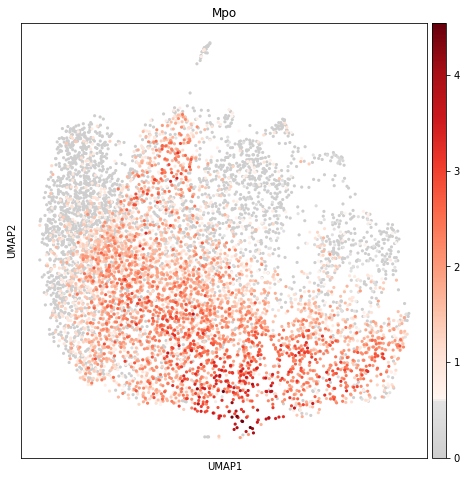

In [90]:
sc.pl.umap(adata, color=['Elane', 'Gfi1', 'Cebpe'], use_raw=False, color_map=mymap, size=40)
sc.pl.draw_graph(adata, color=['Elane', 'Gfi1', 'Cebpe'], use_raw=False, color_map=mymap, size=40)
sc.pl.umap(adata, color=['Mpo'], use_raw=False, color_map=mymap, size=40)

## Monocyte progenitors

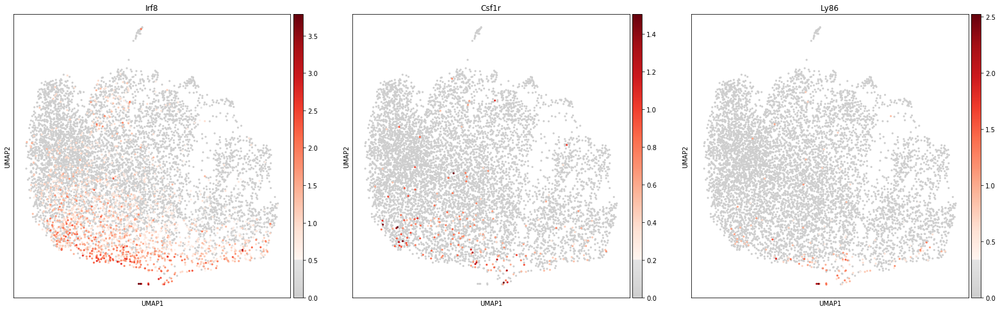

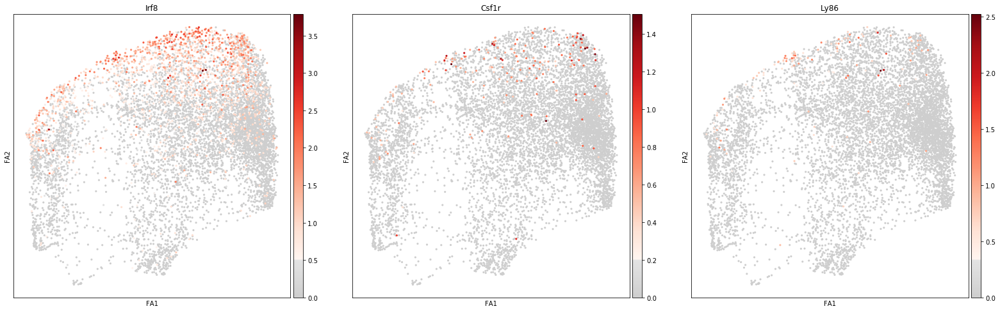

In [83]:
sc.pl.umap(adata, color=['Irf8', 'Csf1r', 'Ly86'], use_raw=False, color_map=mymap, size=40)
sc.pl.draw_graph(adata, color=['Irf8', 'Csf1r', 'Ly86'], use_raw=False, color_map=mymap, size=40)

## Basophils and mast cells

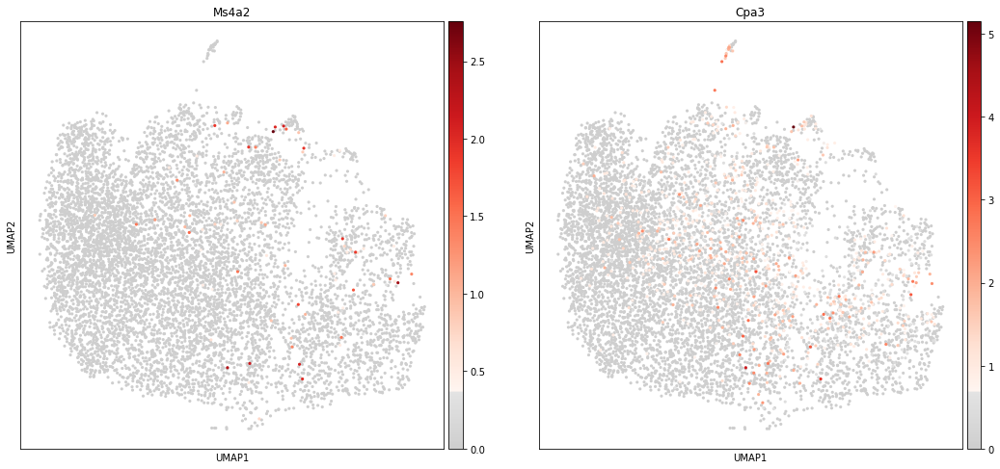

In [84]:
sc.pl.umap(adata, color=['Ms4a2', 'Cpa3' ], use_raw=False, color_map=mymap, size=40)

# 7. Neutrophils markers from MCA

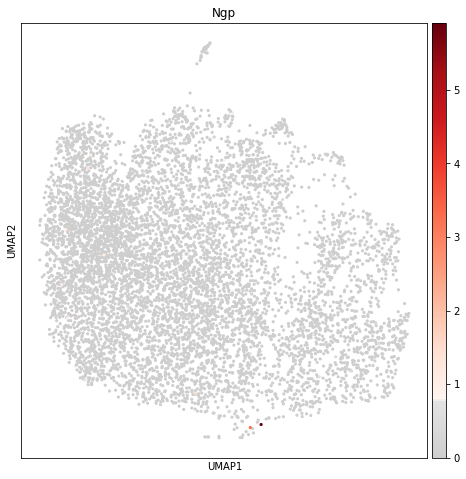

In [86]:
sc.pl.umap(adata, color=[ 'Ngp'], use_raw=False, color_map=mymap, size=40)

# 6. Final cell-type annotation - label harmonization


In [92]:
# Categories to rename
adata.obs['final_annotation'] = adata.obs['louvain_r1']
adata.rename_categories('final_annotation', ['HSPCs,1', 'Neutrophils,1', 'Neutrophils,2', 'Lymphocyte progenitors, 1', 'Megakaryocyte progenitors, 1', 'HSPCs,2','Lymphocyte progenitors, 2','Lymphocyte progenitors, 3', 'Neutrophils, 3', 'Megakaryocyte progenitors, 2', 'Erythrocytes', 'Unknown'])

In [93]:
tmp = adata.obs['final_annotation']
tmp = ['HSPCs' if item.startswith('HSPCs') else item for item in tmp]
tmp = ['Lymphocyte progenitors' if item.startswith('Lymphocyte progenitors') else item for item in tmp]
tmp = ['Erythrocytes' if item.startswith('Erythrocyte') else item for item in tmp]
tmp = ['Neutrophils' if item.startswith('Neutrophils') else item for item in tmp]
tmp = ['Megakaryocyte progenitors' if item.startswith('Megakaryocyte') else item for item in tmp]
adata.obs['final_annotation'] = tmp

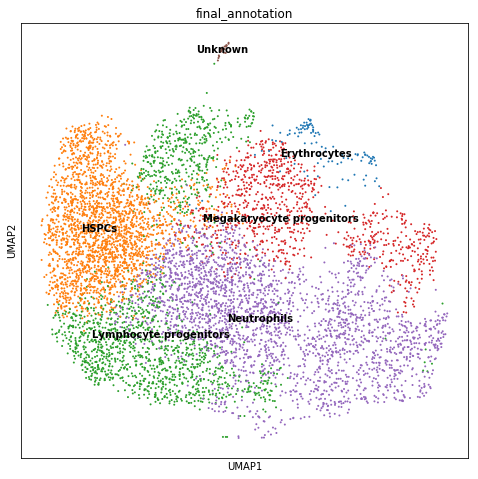

In [5]:
sc.pl.umap(adata, color='final_annotation', legend_loc='on data')

In [6]:
adata = adata[adata.obs['final_annotation'] != 'Unknown']
adata.shape

(7448, 12819)

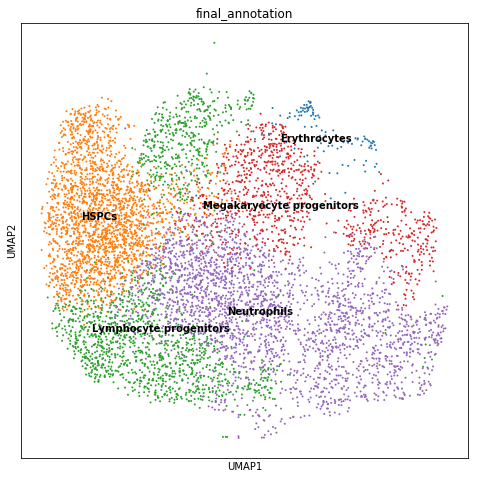

In [5]:
sc.pl.umap(adata, color='final_annotation', legend_loc='on data')

# PAGA

In [7]:
sc.tl.paga(adata, groups='final_annotation')

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)


--> added 'pos', the PAGA positions (adata.uns['paga'])


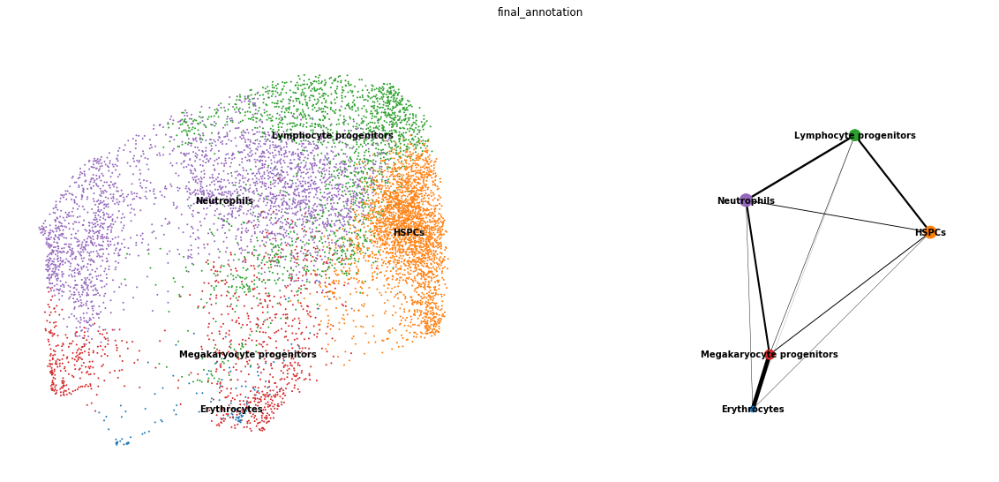

--> added 'pos', the PAGA positions (adata.uns['paga'])


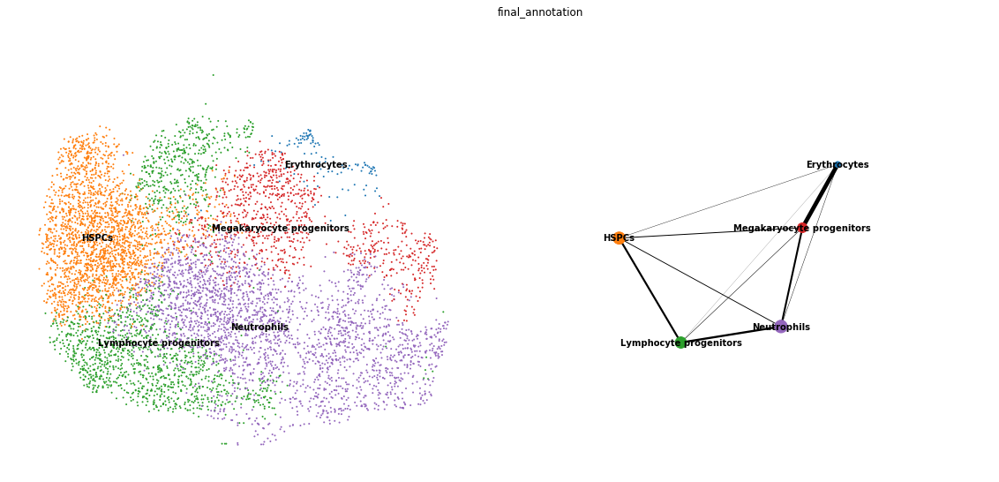

In [8]:
sc.pl.paga_compare(adata, color='final_annotation')
sc.pl.paga_compare(adata, basis='umap', color='final_annotation')

In [9]:
# save final result
adata.write(results_file)

# Erythrocyte differentiation
Here we want to investigate the trajectory of erythrocytes differentiation using DPT.

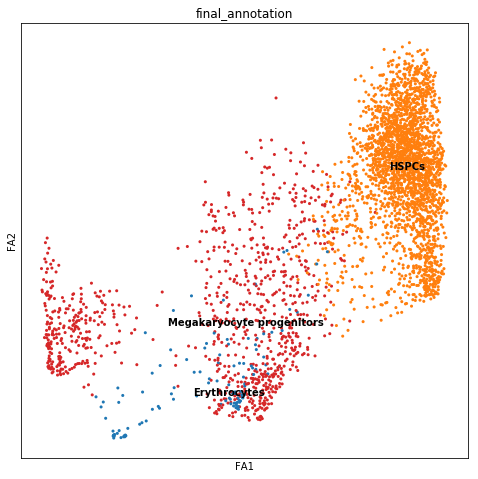

In [10]:
# Subsetting adata to only the clusters included in the trajectory
adata_ery = adata[adata.obs['final_annotation'].isin(['HSPCs','Megakaryocyte progenitors','Erythroid progenitors', 'Erythrocytes'])]
sc.pl.draw_graph(adata_ery, color='final_annotation', legend_loc='on data')

In [11]:
# Calculate pseudotime with DPT
adata_ery.uns['iroot'] = np.flatnonzero(adata_ery.obs['final_annotation'] == 'HSPCs')[0]
sc.tl.dpt(adata_ery, n_branchings=0, n_dcs=15)

computing Diffusion Pseudotime using n_dcs=15
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


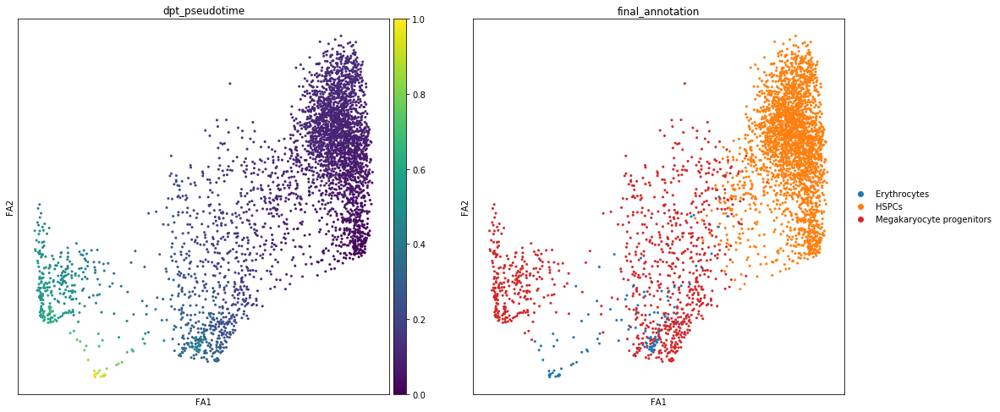

In [12]:
sc.pl.draw_graph(adata_ery, color=['dpt_pseudotime', 'final_annotation'])

In [13]:
# Save ordering of cells in the original adata object

# save adata_ery.obs as a dataframe and make barcodes column accessible
adata_ery_df = adata_ery.obs.reset_index()
adata_ery_df.head()

,barcode,n_counts,log_counts,n_genes,mt_frac,size_factors,louvain_r1,final_annotation,dpt_pseudotime
0,AAACCTGAGCCGTCGT-1,14360.0,9.572202,4019,0.024025,1.922895,9,Megakaryocyte progenitors,0.470774
1,AAACCTGCAGACAAAT-1,6222.0,8.735847,2546,0.021697,0.914308,4,Megakaryocyte progenitors,0.207079
2,AAACCTGTCAGAGGTG-1,4014.0,8.297544,1819,0.029148,0.563239,5,HSPCs,0.000000
3,AAACGGGCACCGATAT-1,10938.0,9.299998,3362,0.023770,1.525452,9,Megakaryocyte progenitors,0.513819
4,AAACGGGCACGGTAGA-1,7860.0,8.969542,2897,0.029008,1.169215,4,Megakaryocyte progenitors,0.257081


In [14]:
# prepare adata_ery_df for merging
adata_ery_df = adata_ery_df[['barcode', 'dpt_pseudotime']]
adata_ery_df.head()

,barcode,dpt_pseudotime
0,AAACCTGAGCCGTCGT-1,0.470774
1,AAACCTGCAGACAAAT-1,0.207079
2,AAACCTGTCAGAGGTG-1,0.000000
3,AAACGGGCACCGATAT-1,0.513819
4,AAACGGGCACGGTAGA-1,0.257081


In [15]:
# save adata.obs as a dataframe and make barcodes column accessible
adata_df = adata.obs.reset_index()
adata_df.head()

,barcode,n_counts,log_counts,n_genes,mt_frac,size_factors,louvain_r1,final_annotation,dpt_pseudotime
0,AAACCTGAGATATGGT-1,4320.0,8.371011,1847,0.040278,0.559041,3,Lymphocyte progenitors,NaN
1,AAACCTGAGCCGTCGT-1,14360.0,9.572202,4019,0.024025,1.922895,9,Megakaryocyte progenitors,0.470774
2,AAACCTGAGGGAACGG-1,6076.0,8.712102,2466,0.024194,0.872142,3,Lymphocyte progenitors,NaN
3,AAACCTGAGGGTCTCC-1,4322.0,8.371473,1852,0.031698,0.570574,6,Lymphocyte progenitors,NaN
4,AAACCTGCAACACCCG-1,6649.0,8.802221,2359,0.031734,0.843666,6,Lymphocyte progenitors,NaN


In [16]:
# merge the two dataframes
adata_merge = adata_df.merge(adata_ery_df, how='left', on='barcode')
adata_merge.head()

,barcode,n_counts,log_counts,n_genes,mt_frac,size_factors,louvain_r1,final_annotation,dpt_pseudotime_x,dpt_pseudotime_y
0,AAACCTGAGATATGGT-1,4320.0,8.371011,1847,0.040278,0.559041,3,Lymphocyte progenitors,NaN,NaN
1,AAACCTGAGCCGTCGT-1,14360.0,9.572202,4019,0.024025,1.922895,9,Megakaryocyte progenitors,0.470774,0.470774
2,AAACCTGAGGGAACGG-1,6076.0,8.712102,2466,0.024194,0.872142,3,Lymphocyte progenitors,NaN,NaN
3,AAACCTGAGGGTCTCC-1,4322.0,8.371473,1852,0.031698,0.570574,6,Lymphocyte progenitors,NaN,NaN
4,AAACCTGCAACACCCG-1,6649.0,8.802221,2359,0.031734,0.843666,6,Lymphocyte progenitors,NaN,NaN


In [17]:
# reassign merged dataframe as adata.obs
adata_merge.set_index('barcode', inplace = True)
adata.obs = adata_merge

In [18]:
# save final result
adata.write(results_file)